## Cuy Bodyweight Mask R-CNN   -  Inspeccionar el modelo entrenado
Código y visualizaciones para probar, depurar y evaluar el modelo de Mask R-CNN para la estimación del peso del cuy.

In [1]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import skimage
# Mask R-CNN librerias
import utils
import visualize
from visualize import display_images
import model as modellib
from model import log

%matplotlib inline 

# Directorio principal del proyecto
ROOT_DIR = os.getcwd()

# Directorios para guardar los logs
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

custom_WEIGHTS_PATH = r'C:\Users\Lenovo\Documents\logs\mobilenetv1_20210908T0944_B\weight_mask_rcnn_cuy_mobilenetv1_0050.h5'
dataset_DIR = r"C:\Users\Lenovo\OneDrive\Imágenes\datasetx4"
file_BODYWEIGHT_PATH = os.path.join(dataset_DIR, 'cuy_bw_augmented.txt')

C:\Users\Lenovo\anaconda3\envs\maskRCNN\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\Lenovo\anaconda3\envs\maskRCNN\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\Lenovo\anaconda3\envs\maskRCNN\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\Lenovo\anaconda3\envs\maskRCNN\lib\site-packages\ten

## Configurationes

In [2]:
import cuy

config = cuy.CuyConfig()

class InferenceConfig(config.__class__):
    # Detecta una imagen a la vez
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
config.display()


Configurations Superlee:
BACKBONE                       mobilenetv1
BACKBONE_SHAPES                [[160 160]
 [ 80  80]
 [ 40  40]
 [ 20  20]
 [ 10  10]]
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
BW_BRANCH                      B
DETECTION_MAX_INSTANCES        10
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
EPOCHS                         50
GPU_COUNT                      1
IMAGES_PER_GPU                 1
IMAGE_MAX_DIM                  640
IMAGE_MIN_DIM                  640
IMAGE_PADDING                  True
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [640 640   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
MASK_POOL_SIZE                 14
MASK_SHAPE                     [56, 56]
MAX_GT_INSTANCES               50
MEAN_PIXEL                     [123.7 116.8 103.9]
MINI_MASK_SHAPE                (56, 56)
NAME           

## Notebook preferences

In [3]:
# Dispositivo para la cargar la red neuronal
DEVICE = "/gpu:0"  # /cpu:0 or /gpu:0

# Inspeccionar el modelo en modo entrenamiento o inferencia
# valores: 'inference' or 'training'
TEST_MODE = "inference"

def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

## Cargar el dataset de validación

In [4]:
# Cargar el dataset de validación
dataset = cuy.CuyDataset()
dataset.load_dataset(dataset_DIR, "val", file_BODYWEIGHT_PATH)

# Preparar el dataset
dataset.prepare()

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))

Images: 1252
Classes: ['BG', 'cuy']


## Cargar el modelo

In [5]:
# Crear el modelo en modo inferencia
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR, config=config)

# Cargar los pesos de la red
print("Loading weights ", custom_WEIGHTS_PATH)
model.load_weights(custom_WEIGHTS_PATH, by_name=True)






Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
box_ind is deprecated, use box_indices instead

Instructions for updating:
Use `tf.cast` instead.


Instructions for updating:
Use `tf.cast` instead.


RuntimeError: ('The name "mrcnn_mask_conv_dw_1" is used 2 times in the model. All layer names should be unique. Layer names: ', ['input_image', 'conv0', 'conv0_bn', 'conv0_relu', 'conv_dw_1', 'conv_dw_1_bn', 'conv_dw_1_relu', 'conv_pw_1', 'conv_pw_1_bn', 'conv_pw_1_relu', 'conv_dw_2', 'conv_dw_2_bn', 'conv_dw_2_relu', 'conv_pw_2', 'conv_pw_2_bn', 'conv_pw_2_relu', 'conv_dw_3', 'conv_dw_3_bn', 'conv_dw_3_relu', 'conv_pw_3', 'conv_pw_3_bn', 'conv_pw_3_relu', 'conv_dw_4', 'conv_dw_4_bn', 'conv_dw_4_relu', 'conv_pw_4', 'conv_pw_4_bn', 'conv_pw_4_relu', 'conv_dw_5', 'conv_dw_5_bn', 'conv_dw_5_relu', 'conv_pw_5', 'conv_pw_5_bn', 'conv_pw_5_relu', 'conv_dw_6', 'conv_dw_6_bn', 'conv_dw_6_relu', 'conv_pw_6', 'conv_pw_6_bn', 'conv_pw_6_relu', 'conv_dw_7', 'conv_dw_7_bn', 'conv_dw_7_relu', 'conv_pw_7', 'conv_pw_7_bn', 'conv_pw_7_relu', 'conv_dw_8', 'conv_dw_8_bn', 'conv_dw_8_relu', 'conv_pw_8', 'conv_pw_8_bn', 'conv_pw_8_relu', 'conv_dw_9', 'conv_dw_9_bn', 'conv_dw_9_relu', 'conv_pw_9', 'conv_pw_9_bn', 'conv_pw_9_relu', 'conv_dw_10', 'conv_dw_10_bn', 'conv_dw_10_relu', 'conv_pw_10', 'conv_pw_10_bn', 'conv_pw_10_relu', 'conv_dw_11', 'conv_dw_11_bn', 'conv_dw_11_relu', 'conv_pw_11', 'conv_pw_11_bn', 'conv_pw_11_relu', 'conv_dw_12', 'conv_dw_12_bn', 'conv_dw_12_relu', 'conv_pw_12', 'conv_pw_12_bn', 'conv_pw_12_relu', 'conv_dw_13', 'conv_dw_13_bn', 'conv_dw_13_relu', 'conv_pw_13', 'conv_pw_13_bn', 'conv_pw_13_relu', 'fpn_c5p5', 'fpn_p5upsampled', 'fpn_c4p4', 'fpn_p4add', 'fpn_p4upsampled', 'fpn_c3p3', 'fpn_p3add', 'fpn_p3upsampled', 'fpn_c2p2', 'fpn_p2add', 'fpn_p5', 'fpn_p2', 'fpn_p3', 'fpn_p4', 'fpn_p6', 'rpn_model', 'rpn_class', 'rpn_bbox', 'ROI', 'roi_align_classifier', 'mrcnn_class_conv1', 'mrcnn_class_bn1', 'activation_1', 'mrcnn_class_conv2', 'mrcnn_class_bn2', 'activation_2', 'pool_squeeze', 'mrcnn_class_logits', 'mrcnn_bbox_fc', 'mrcnn_class', 'mrcnn_bbox', 'input_image_meta', 'mrcnn_detection', 'lambda_3', 'roi_align_mask', 'mrcnn_mask_conv_dw_1', 'mrcnn_mask_conv_dw_1_bn', 'mrcnn_mask_conv_dw_1_relu', 'mrcnn_mask_conv_pw_1', 'mrcnn_mask_conv_pw_1_bn', 'mrcnn_mask_conv_pw_1_relu', 'mrcnn_mask_conv_dw_2', 'mrcnn_mask_conv_dw_2_bn', 'roi_align_bw', 'mrcnn_mask_conv_dw_2_relu', 'mrcnn_mask_conv_dw_1', 'mrcnn_mask_conv_pw_2', 'mrcnn_mask_conv_dw_1_bn', 'mrcnn_mask_conv_pw_2_bn', 'mrcnn_mask_conv_dw_1_relu', 'mrcnn_mask_conv_pw_2_relu', 'mrcnn_mask_conv_pw_1', 'mrcnn_mask_conv_dw_3', 'mrcnn_mask_conv_pw_1_bn', 'mrcnn_mask_conv_dw_3_bn', 'mrcnn_mask_conv_pw_1_relu', 'mrcnn_mask_conv_dw_3_relu', 'mrcnn_mask_conv_dw_2', 'mrcnn_mask_conv_pw_3', 'mrcnn_mask_conv_dw_2_bn', 'mrcnn_mask_conv_pw_3_bn', 'mrcnn_mask_conv_dw_2_relu', 'mrcnn_mask_conv_pw_3_relu', 'mrcnn_mask_conv_pw_2', 'mrcnn_mask_conv_dw_4', 'mrcnn_mask_conv_pw_2_bn', 'mrcnn_mask_conv_dw_4_bn', 'mrcnn_mask_conv_pw_2_relu', 'mrcnn_mask_conv_dw_4_relu', 'mrcnn_bw_conv3', 'mrcnn_mask_conv_pw_4', 'mrcnn_bw_maxpooling1', 'mrcnn_mask_conv_pw_4_bn', 'mrcnn_bw_conv4', 'mrcnn_mask_conv_pw_4_relu', 'mrcnn_bw_maxpooling2', 'mrcnn_mask_deconv1', 'mrcnn_bw_flatten', 'mrcnn_mask_deconv2', 'mrcnn_bw_dense', 'mrcnn_mask', 'mrcnn_bodyweight'])

In [26]:
from importlib import reload # was constantly changin the visualization, so I decided to reload it instead of notebook
reload(utils)

<module 'utils' from 'C:\\Users\\Lenovo\\Documents\\GitHub\\Weight-Mask-R-CNN\\utils.py'>

## Run Detection

image ID: dataset.IMG_20210624_103808_orig (831) 1010.0


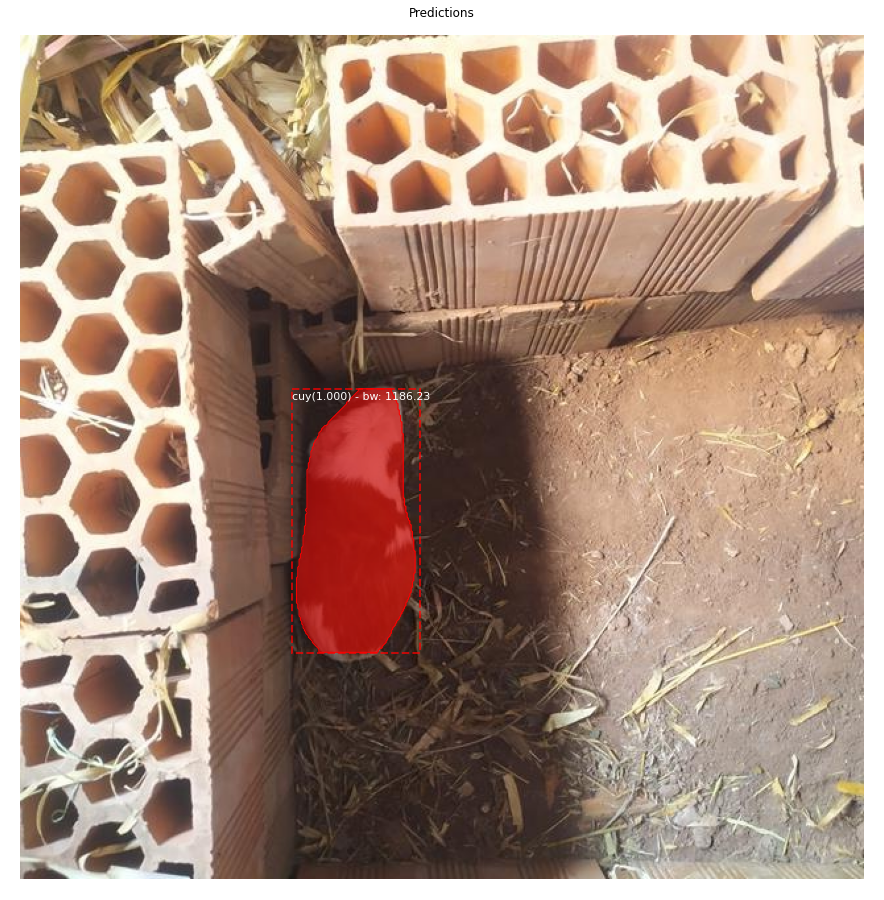

In [7]:
image_id = random.choice(dataset.image_ids)

image, image_meta, gt_class_id, gt_bbox, gt_mask, gt_weight =\
          modellib.load_image_gt_bw(dataset, config, image_id, use_mini_mask=False)
info = dataset.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, info['weight']))


# Correr la detección de objetos
results = model.detect_bodyweight([image], verbose=0)

# Mostrar resultados
ax = get_ax(1)
r = results[0]

# Visualizar los resultados en una imagen
visualize.display_instances_bw(image, r['rois'], r['masks'] ,r['bodyweight'], r['class_ids'], 
                              dataset.class_names, r['scores'], ax=ax,
                              title="Predictions")


In [8]:
# Visualizar las dimensiones de los valores de la verdad fundamental y los valores predecidos
print('Verdad fundamental')
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)
log("gt_bodyweight", gt_weight)
print('Predecidos')
log("class_ids",r['class_ids'])
log("rois",r['rois'])
log("bodyweight",r['bodyweight'][0])
log("masks",r['masks'])

Verdad fundamental
gt_class_id              shape: (1,)                  min:    1.00000  max:    1.00000
gt_bbox                  shape: (1, 4)                min:  205.00000  max:  476.00000
gt_mask                  shape: (640, 640, 1)         min:    0.00000  max:    1.00000
gt_bodyweight            shape: (1,)                  min: 1010.00000  max: 1010.00000
Predecidos
class_ids                shape: (1,)                  min:    1.00000  max:    1.00000
rois                     shape: (1, 4)                min:  206.00000  max:  468.00000
bodyweight               shape: (1,)                  min: 1186.22522  max: 1186.22522
masks                    shape: (640, 640, 1)         min:    0.00000  max:    1.00000


## Color Splash

Esto es por ilustración. Se puede llamar a "cuy.py" con la opción "splash" para visualizar mejor la imagen.

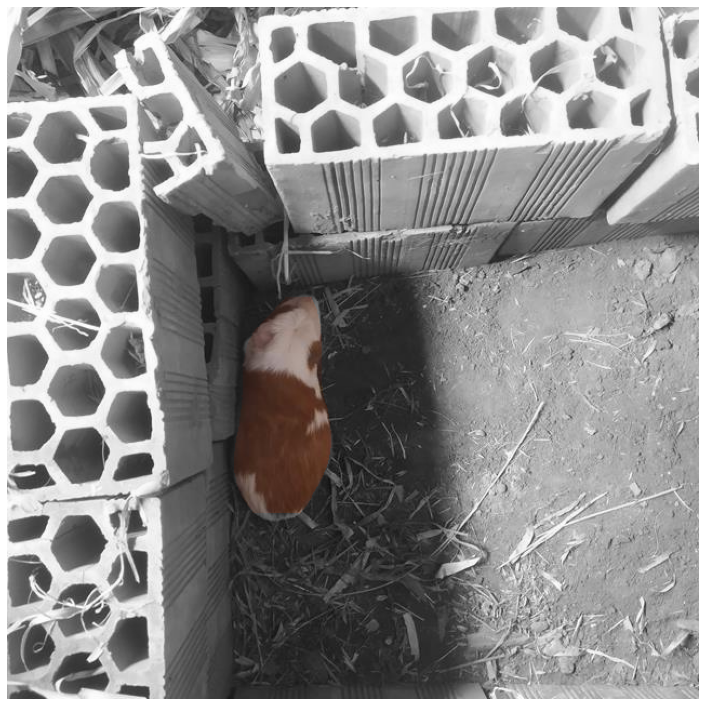

In [9]:
splash = cuy.color_splash(image, r['masks'])
display_images([splash], cols=1)

## Metrics (Precision-Recall, AP, Overlaps, Weight)

In [10]:
APs50, APs75, APsCOCO= [], [], []
Precision, Recall, Overlap = [], [], []
w_true, w_pred = [] , []
for image_id in dataset.image_ids:
        
    image, image_meta, gt_class_id, gt_bbox, gt_mask, gt_weight =\
        modellib.load_image_gt_bw(dataset, config, image_id, use_mini_mask=False)
        
    info = dataset.image_info[image_id]
        
    results = model.detect_bodyweight([image], verbose=0)
    r = results[0]
        
    if(np.size(r['bodyweight']) == 1):
        w_true.append(info['weight'])
        w_pred.append(r['bodyweight'][0][0])
            
    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox, gt_class_id, gt_mask, 
                       r['rois'], r['class_ids'], r['scores'],
                       r['masks'], iou_threshold=0.5)
    APs50.append(AP)
    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox, gt_class_id, gt_mask, 
                       r['rois'], r['class_ids'], r['scores'],
                       r['masks'], iou_threshold=0.75)
    APs75.append(AP)
    AP_level = []
    for x in np.linspace(0.5, 0.95, num=10):
        AP, _, _, _ =\
            utils.compute_ap(gt_bbox, gt_class_id, gt_mask, 
                       r['rois'], r['class_ids'], r['scores'],
                       r['masks'], iou_threshold=x)
        AP_level.append(AP)
        if x == 0.5: APs50.append(AP)
        if x == 0.75: APs75.append(AP) 
    APsCOCO = np.mean(AP_level)  
    
    Precision.append(precisions)
    Recall.append(recalls)
    Overlap.append(overlaps)

In [11]:
print('mAP@50: {:.2f}'.format(np.mean(APs50)))
print('mAP@75: {:.2f}'.format(np.mean(APs75)))
print('AP: {:.2f}'.format(np.mean(APsCOCO)))

mAP@50: 1.00
mAP@75: 1.00
AP: 0.70


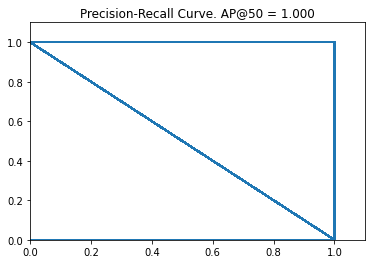

In [12]:
all_precision = []
all_recall = []
for i, _ in enumerate(Precision):
    for j, _ in enumerate(Precision[i]):
        all_precision.append(Precision[i][j])
        all_recall.append(Recall[i][j])
        
visualize.plot_precision_recall(np.mean(APs50), all_precision, all_recall)

## Weight estimation
### Compute MSE, RMSE, R^2

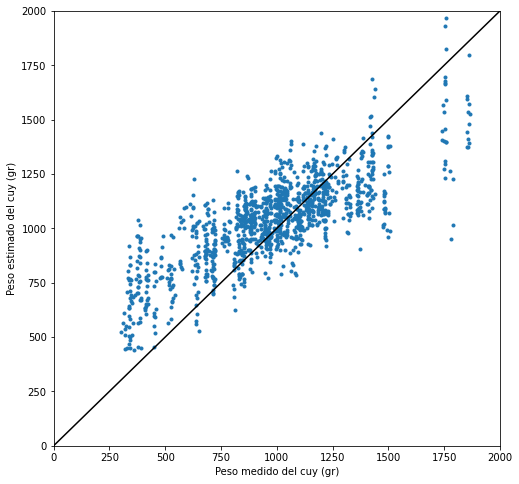

Conjunto evaluado: 1235
MAE: 165.26
MSE: 43836.42
RMSE: 209.37
MAPE: 22.17%
R2: 55.68%


In [13]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_percentage_error

# Convertir las listas en arrays
y_true_array = np.array(w_true)
y_pred_array = np.array(w_pred)
# Computar el error
mae = mean_absolute_error(y_true_array, y_pred_array)
mse = mean_squared_error(y_true_array, y_pred_array)
rmse = np.sqrt(mse)
r2 = r2_score(y_true_array, y_pred_array)
mape = mean_absolute_percentage_error(y_true_array, y_pred_array)
# Visulizar los valores fundamentales y predecidos
x=np.linspace(0,2000) 
plt.figure(figsize=(8,8))
plt.scatter(y_true_array, y_pred_array, marker='.')
plt.plot(x,x,'k-')
plt.xlabel('Peso medido del cuy (gr)')
plt.ylabel('Peso estimado del cuy (gr)')
plt.ylim(0,2000)
plt.xlim(0,2000)
plt.show()
# Mostrar el resultado
print('Conjunto evaluado: {}'.format(len(y_true_array)))
print('MAE: {:.2f}'.format(mae))
print('MSE: {:.2f}'.format(mse))
print('RMSE: {:.2f}'.format(rmse))
print('MAPE: {:.2f}%'.format(mape*100))
print('R2: {:.2f}%'.format(r2*100))


## Predicción Paso a Paso

## Etapa 1: Region Proposal Network

La Red de Proposición de Regiones (RPN) ejecuta un clasificador binario ligero en una gran cantidad de cajas (anclas o anchors) sobre la imagen y devuelve puntuaciones de objeto/no-objeto. Las anclas con una puntuación alta de *objetividad* (anclas positivas) se pasan a la etapa dos para ser clasificados.
A menudo, incluso las anclas positivas no cubren completamente los objetos. Entonces, la RPN también procede un refinamiento (un delta en ubicación y tamaño) que se aplicará a las anclas para cambiarlos y redimensionarlos un poco a los limites correctos del objeto.

### 1.a RPN Targets

Los targets RPN son los valores de entrenaminto para la RPN. Para generar los targets, comenzamos con una cuadrícula de anclas que cubren la imagen completa a diferentes escalas, y luego calculamos el IoU de las anclas con el objeto de la verdad fundamental. Los anclas positivos son aquellos que tienen un IoU >= 0.7 con cualquier objeto de la verdad fundamental, y los anclas negativos son aquellos que no cubren ningún objeto por más de 0.3 IoU. Los anclas intermedios, se consideran neutrales y están excluidos del entrenamiento.

Para entrenar el regresor RPN, también calculamos el desplazamiento y el cambio de tamaño ncecesarios para que el ancla cubra el objeto de la verdad fundamental por completo

In [17]:
# Generar los targets de entrenamiento RPN
# Anchor es el término en inglés de ancla
# target_rpn_match es 1 para anclas positivas, -1 para anclas negativas
# y 0 para anclas neutrales
target_rpn_match, target_rpn_bbox = modellib.build_rpn_targets(
    image.shape, model.anchors, gt_class_id, gt_bbox, model.config)
log("target_rpn_match", target_rpn_match)
log("target_rpn_bbox", target_rpn_bbox)

positive_anchor_ix = np.where(target_rpn_match[:] == 1)[0]
negative_anchor_ix = np.where(target_rpn_match[:] == -1)[0]
neutral_anchor_ix = np.where(target_rpn_match[:] == 0)[0]
positive_anchors = model.anchors[positive_anchor_ix]
negative_anchors = model.anchors[negative_anchor_ix]
neutral_anchors = model.anchors[neutral_anchor_ix]
log("positive_anchors", positive_anchors)
log("negative_anchors", negative_anchors)
log("neutral anchors", neutral_anchors)

# Aplicar refinamiento de deltas a los anclas positivos
refined_anchors = utils.apply_box_deltas(
    positive_anchors,
    target_rpn_bbox[:positive_anchors.shape[0]] * model.config.RPN_BBOX_STD_DEV)
log("refined_anchors", refined_anchors, )


target_rpn_match         shape: (102300,)             min:   -1.00000  max:    1.00000
target_rpn_bbox          shape: (256, 4)              min:    0.00000  max:    1.56378
positive_anchors         shape: (1, 4)                min:  224.00000  max:  592.00000
negative_anchors         shape: (255, 4)              min: -128.00000  max:  698.50967
neutral anchors          shape: (102044, 4)           min: -362.03867  max:  938.03867
refined_anchors          shape: (1, 4)                min:  216.00000  max:  609.00000


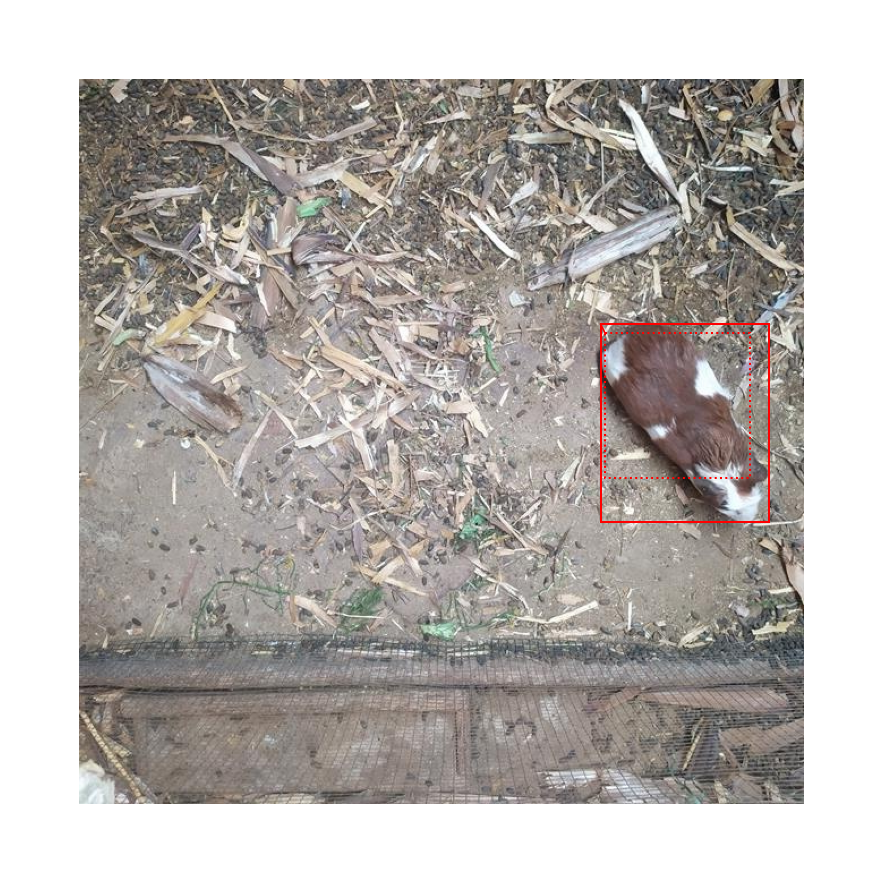

In [18]:
# Mostrar los anclas positivas antes del redinamiento (lineas punteadas) y despues del refinamiento (lineas sólidas)
visualize.draw_boxes(image, boxes=positive_anchors, refined_boxes=refined_anchors, ax=get_ax())

### 1.b Predicciones RPN

Aquí ejecutamos el grafo RPN y mostramos las predicciones

In [23]:
# Ejecutar el sub-grafo RPN
pillar = model.keras_model.get_layer("ROI").output  # node desde donde inicia a buscar

# TF 1.4 and 1.9 introduce new versions of NMS. Search for all names to support TF 1.3~1.10
nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV2:0")
if nms_node is None: #TF 1.9-1.10
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV3:0")

rpn = model.run_graph([[image]], [
    ("rpn_class", model.keras_model.get_layer("rpn_class").output),
    ("pre_nms_anchors", model.ancestor(pillar, "ROI/pre_nms_anchors:0")),
    ("refined_anchors", model.ancestor(pillar, "ROI/refined_anchors:0")),
    ("refined_anchors_clipped", model.ancestor(pillar, "ROI/refined_anchors_clipped:0")),
    ("post_nms_anchor_ix", nms_node),
    ("proposals", model.keras_model.get_layer("ROI").output),
])

rpn_class                shape: (1, 102300, 2)        min:    0.00000  max:    1.00000
pre_nms_anchors          shape: (1, 6000, 4)          min: -362.03867  max:  938.03870
refined_anchors          shape: (1, 6000, 4)          min: -427.47025  max: 1000.67773
refined_anchors_clipped  shape: (1, 6000, 4)          min:    0.00000  max:  640.00000
post_nms_anchor_ix       shape: (501,)                min:    0.00000  max: 5998.00000
proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000


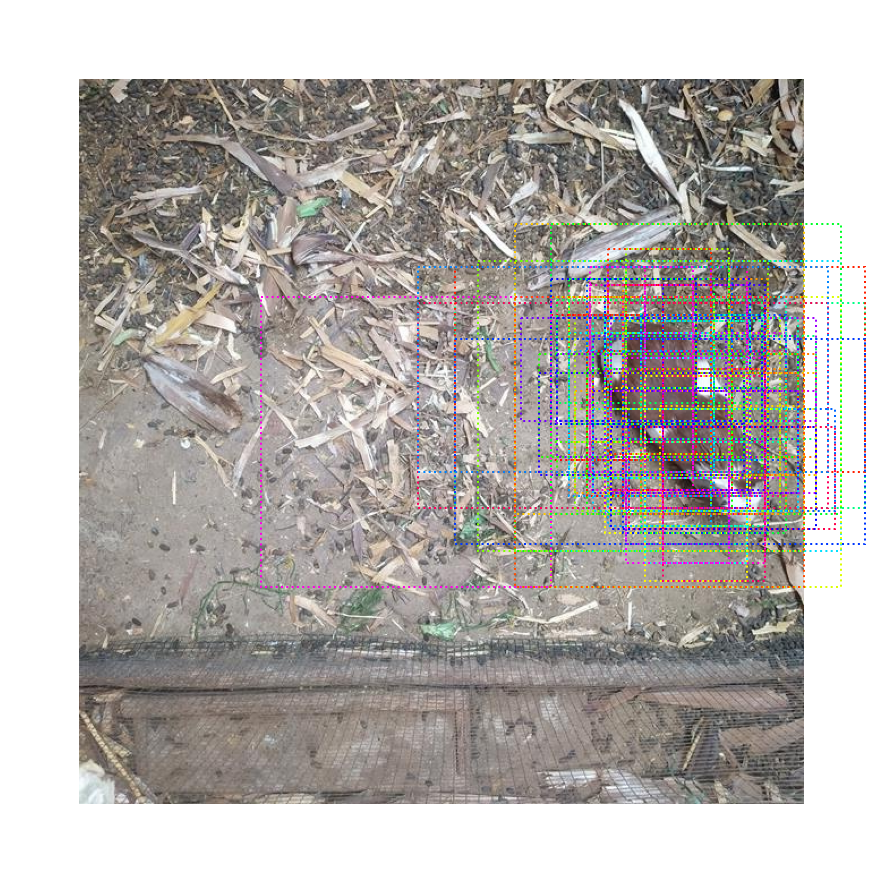

In [24]:
# Mostrar los mejores anclas por puntuación (antes del refinamiento)
limit = 100
sorted_anchor_ids = np.argsort(rpn['rpn_class'][:,:,1].flatten())[::-1]
visualize.draw_boxes(image, boxes=model.anchors[sorted_anchor_ids[:limit]], ax=get_ax())

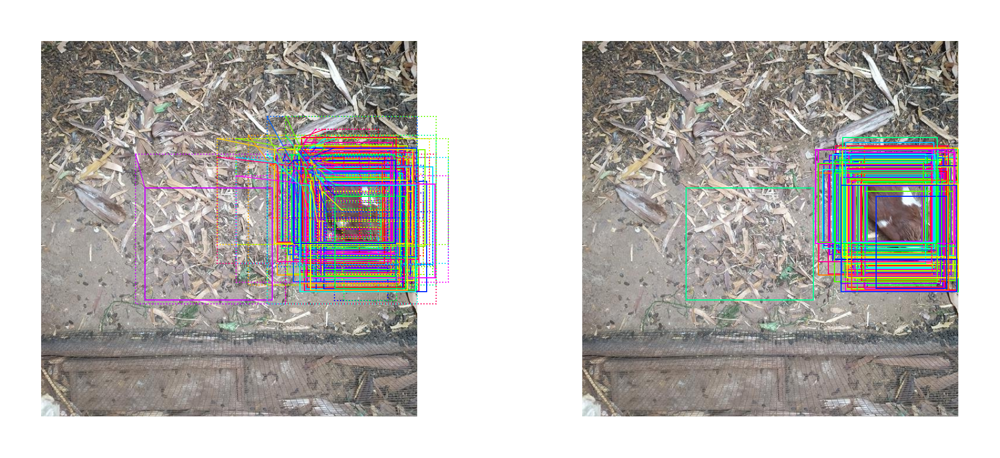

In [53]:
# Mostrar los mejores anclas con refinamiento. Luego
# Show top anchors with refinement. Luego con recorte a los limites de la imagen
limit = 100
ax = get_ax(1, 2)
pre_nms_anchors = rpn["pre_nms_anchors"][0]
refined_anchors = rpn["refined_anchors"][0]
refined_anchors_clipped = rpn["refined_anchors_clipped"][0]
visualize.draw_boxes(image, boxes=pre_nms_anchors[:limit],
                     refined_boxes=refined_anchors[:limit], ax=ax[0])
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[:limit], ax=ax[1])

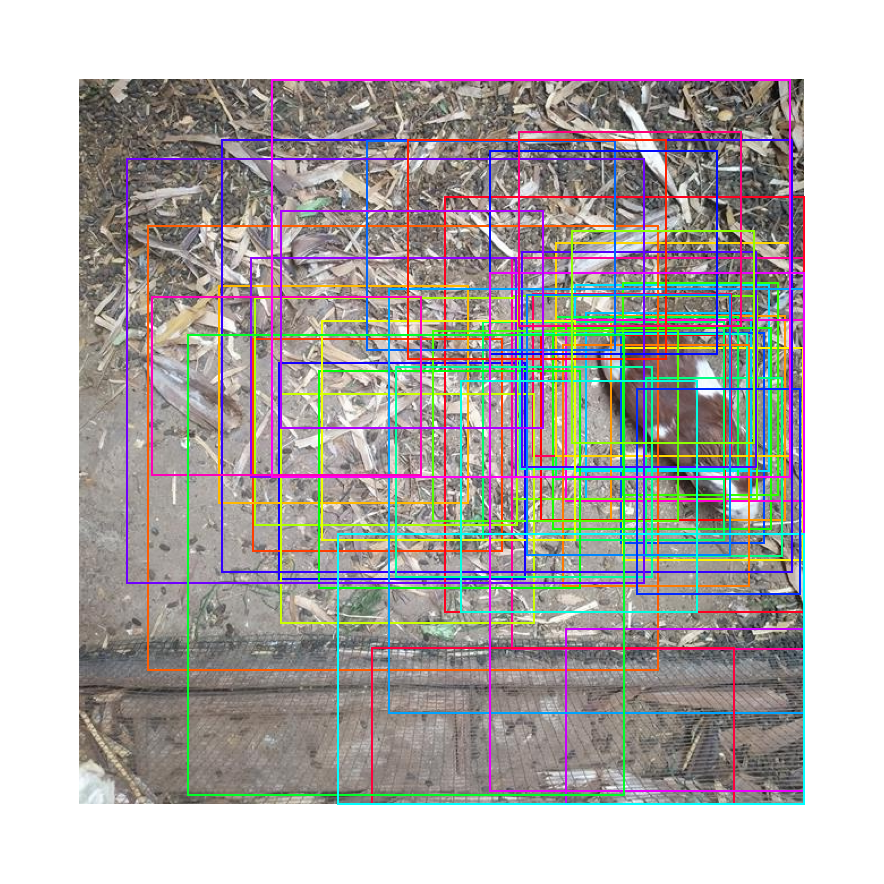

In [54]:
# Mostrar los anclas refinados después de la supresión no-máxima (NMS)
limit = 50
ixs = rpn["post_nms_anchor_ix"][:limit]
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[ixs], ax=get_ax())

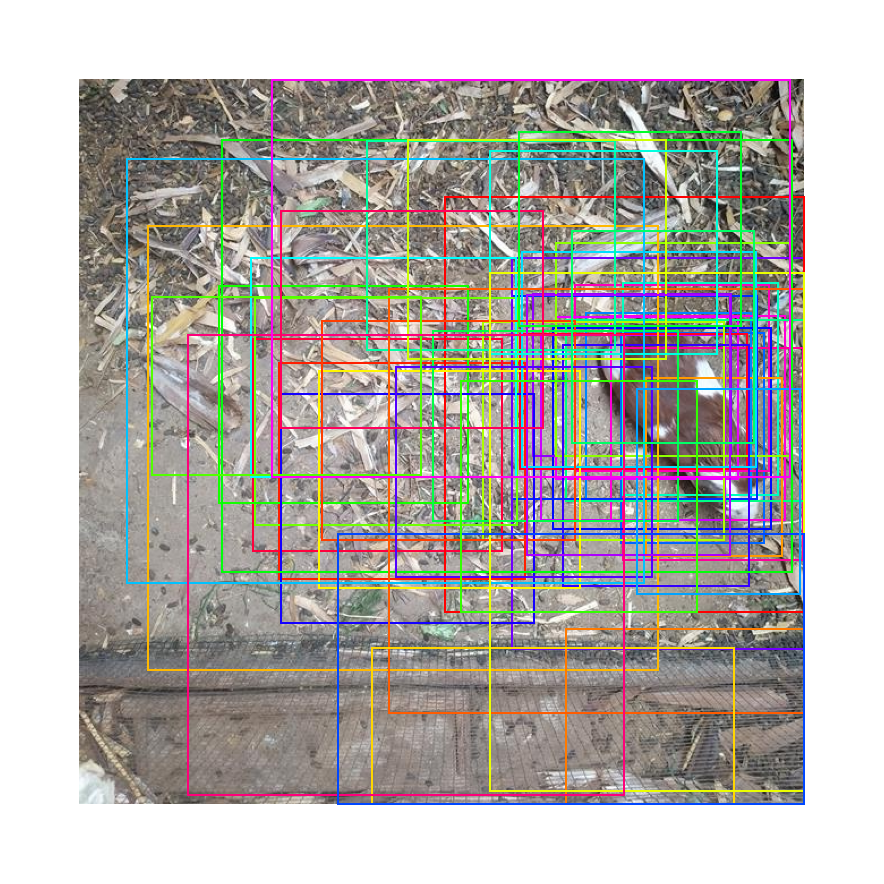

In [29]:
# Mostrar las propuestas finales
# Estas son las mismas que el paso anterior (anclas refinadas después de NMS)
# pero con coordenadas normalizadas a el rango [0,1]
limit = 50
# Convertirlas de nuevo a coordenadas de imagen para visualizarlas
h, w = config.IMAGE_SHAPE[:2]
proposals = rpn['proposals'][0, :limit] * np.array([h, w, h, w])
visualize.draw_boxes(image, refined_boxes=proposals, ax=get_ax())

In [32]:
# Medir el recall de RPN (porcentaje de objetos cubiertos por anclas)
# Aquí medimos el recall por 3 métodos diferentes
# Here we measure recall for 3 different methods:
# - Todos los anclas
# - Todos los anclas refinados
# - Anclas refinados después de NMS
iou_threshold = 0.7

recall, positive_anchor_ids = utils.compute_recall(model.anchors, gt_bbox, iou_threshold)
print("All Anchors ({:5})       Recall: {:.3f}  Positive anchors: {}".format(
    model.anchors.shape[0], recall, len(positive_anchor_ids)))

recall, positive_anchor_ids = utils.compute_recall(rpn['refined_anchors'][0], gt_bbox, iou_threshold)
print("Refined Anchors ({:5})   Recall: {:.3f}  Positive anchors: {}".format(
    rpn['refined_anchors'].shape[1], recall, len(positive_anchor_ids)))

recall, positive_anchor_ids = utils.compute_recall(proposals, gt_bbox, iou_threshold)
print("Post NMS Anchors ({:5})  Recall: {:.3f}  Positive anchors: {}".format(
    proposals.shape[0], recall, len(positive_anchor_ids)))


All Anchors (102300)       Recall: 0.000  Positive anchors: 0
Refined Anchors ( 6000)   Recall: 1.000  Positive anchors: 68
Post NMS Anchors (   50)  Recall: 1.000  Positive anchors: 4


## Etapa 2: Clasificación de Propuestas

Esta etapa toma las propuestas de regiones de la RPN y las clasifica.

### 2.a Clasficación de la propuesta

Ejecute los encabezados del clasificador en propuestas para generar propiedades de clase y regresiones del cuadro delimitador

In [42]:
# Obtener la entrada y salida para el clasificador y los cabezales de la máscara
mrcnn = model.run_graph([[image], [image_meta]], [
    ("proposals", model.keras_model.get_layer("ROI").output),
    ("probs", model.keras_model.get_layer("mrcnn_class").output),
    ("deltas", model.keras_model.get_layer("mrcnn_bbox").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
])

proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000
probs                    shape: (1, 1000, 2)          min:    0.00000  max:    1.00000
deltas                   shape: (1, 1000, 2, 4)       min:   -4.35681  max:    2.62415
masks                    shape: (1, 10, 56, 56, 2)    min:    0.00016  max:    1.00000
detections               shape: (1, 10, 6)            min:    0.00000  max:  605.00000


1 detections: ['cuy']


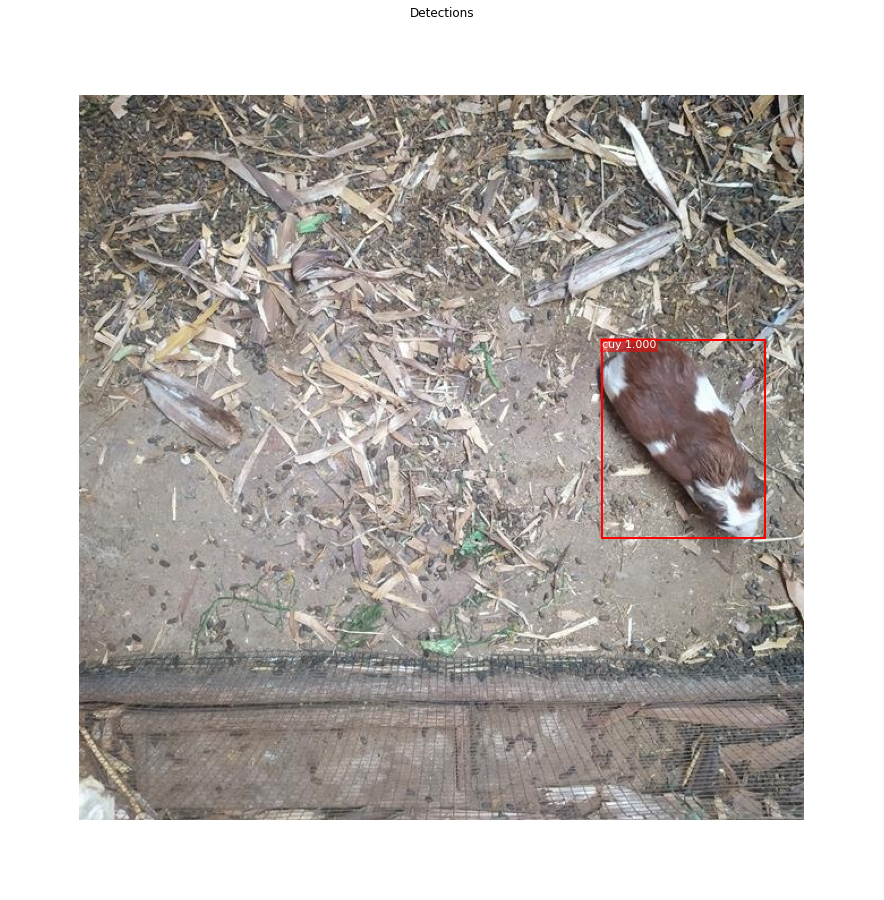

In [51]:
# Obtener el ID de la clase. Recortar el desplazamiento con cero (zero padding)
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]
detections = mrcnn['detections'][0, :det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

captions = ["{} {:.3f}".format(dataset.class_names[int(c)], s) if c > 0 else ""
            for c, s in zip(detections[:, 4], detections[:, 5])]
visualize.draw_boxes(
    image, 
    refined_boxes=detections[:, :4],
    visibilities=[2] * len(detections),
    captions=captions, title="Detections",
    ax=get_ax())

### 2.c Detección paso a paso

Aquí nos sumergimos más en el proceso de procesamiento de las detecciones

In [55]:
# Las propuestas están en coordenadas normalizadas. Ajustar a las coordenadas de la imagen
h, w = config.IMAGE_SHAPE[:2]
proposals = np.around(mrcnn["proposals"][0] * np.array([h, w, h, w])).astype(np.int32)

# Class ID, score, y mask por propuesta
roi_class_ids = np.argmax(mrcnn["probs"][0], axis=1)
roi_scores = mrcnn["probs"][0, np.arange(roi_class_ids.shape[0]), roi_class_ids]
roi_class_names = np.array(dataset.class_names)[roi_class_ids]
roi_positive_ixs = np.where(roi_class_ids > 0)[0]

# Cantidad de ROIs vs filas vacias?
print("{} Valid proposals out of {}".format(np.sum(np.any(proposals, axis=1)), proposals.shape[0]))
print("{} Positive ROIs".format(len(roi_positive_ixs)))

# Conteo de clases
print(list(zip(*np.unique(roi_class_names, return_counts=True))))

501 Valid proposals out of 1000
22 Positive ROIs
[('BG', 978), ('cuy', 22)]


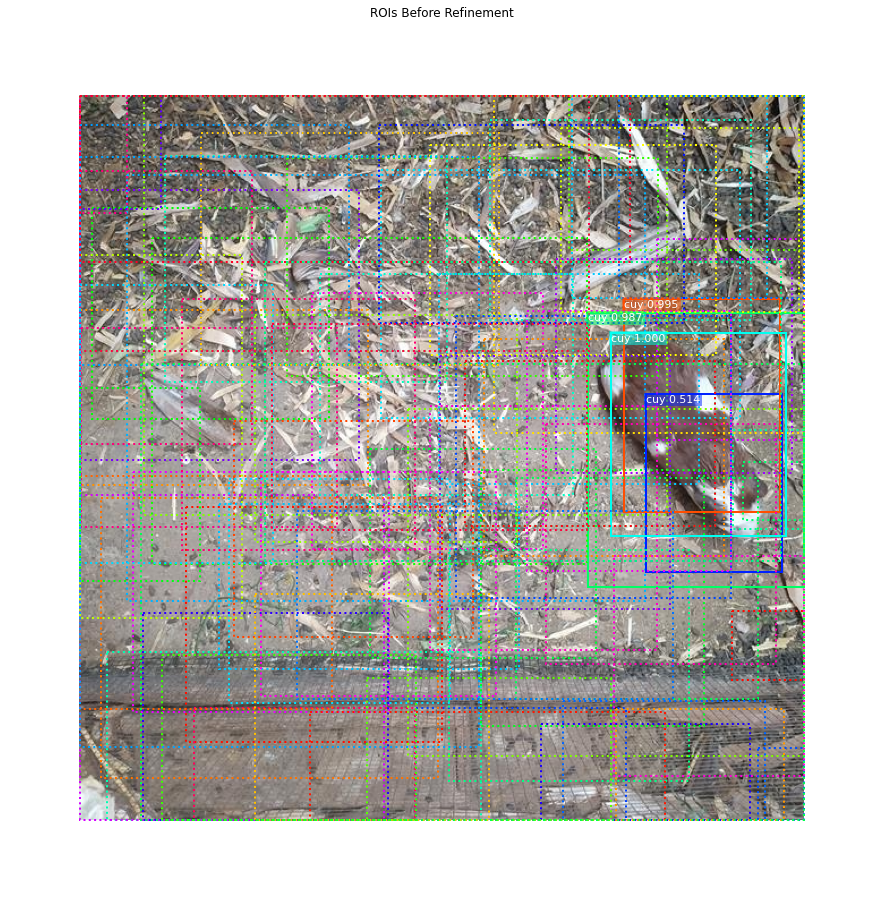

In [56]:
# Mostrar una muestra aleatoria de las propuestas 
# Las propuestas clasificadas como fondo (background) son punteadas, 
# y el resto muestran su clases y su puntuacion de confianza
limit = 200
ixs = np.random.randint(0, proposals.shape[0], limit)
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[ixs], roi_scores[ixs])]
visualize.draw_boxes(image, boxes=proposals[ixs],
                     visibilities=np.where(roi_class_ids[ixs] > 0, 2, 1),
                     captions=captions, title="ROIs Before Refinement",
                     ax=get_ax())

#### Apply Bounding Box Refinement

roi_bbox_specific        shape: (1000, 4)             min:   -4.35681  max:    2.12879
refined_proposals        shape: (1000, 4)             min:  -41.00000  max:  672.00000


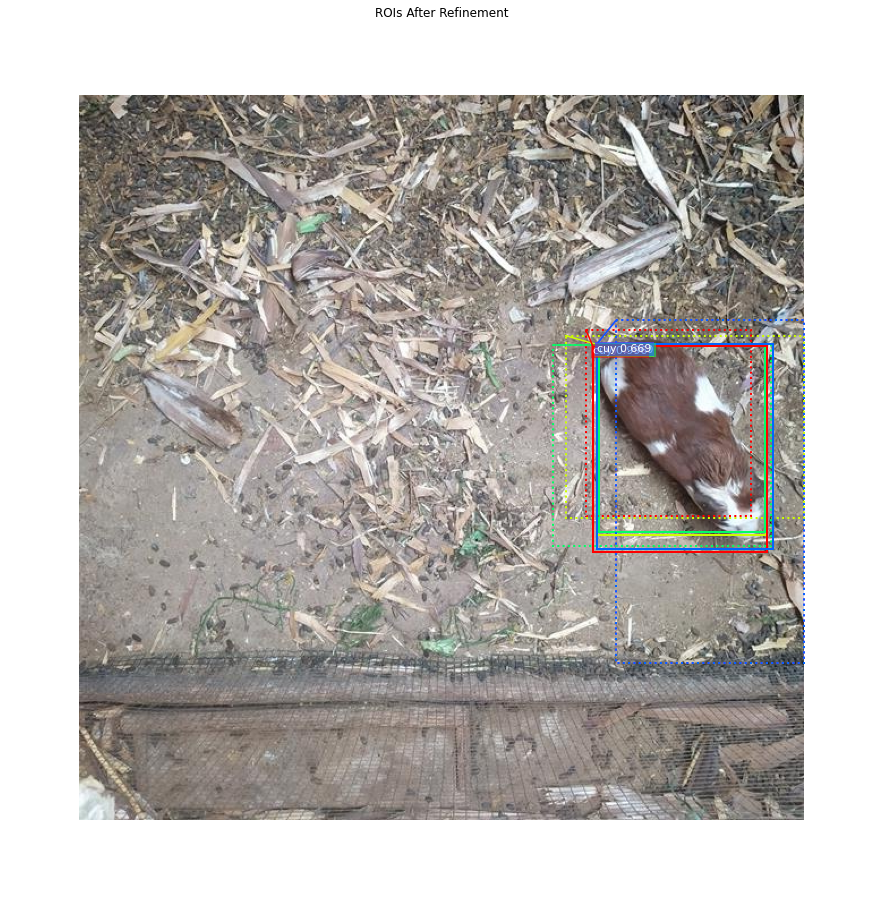

In [57]:
# Desplazamiento del cuadro delimitador específicos de la clase
roi_bbox_specific = mrcnn["deltas"][0, np.arange(proposals.shape[0]), roi_class_ids]
log("roi_bbox_specific", roi_bbox_specific)

# Aplicar transformaciones del cuadro delimitador
# Shape: [N, (y1, x1, y2, x2)]
refined_proposals = utils.apply_box_deltas(
    proposals, roi_bbox_specific * config.BBOX_STD_DEV).astype(np.int32)
log("refined_proposals", refined_proposals)

# Mostrar las propuestas positivas
# ids = np.arange(roi_boxes.shape[0])  # Display all
limit = 5
ids = np.random.randint(0, len(roi_positive_ixs), limit)  # Mostrar ejemplo aleatorio
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[roi_positive_ixs][ids], roi_scores[roi_positive_ixs][ids])]
visualize.draw_boxes(image, boxes=proposals[roi_positive_ixs][ids],
                     refined_boxes=refined_proposals[roi_positive_ixs][ids],
                     visibilities=np.where(roi_class_ids[roi_positive_ixs][ids] > 0, 1, 0),
                     captions=captions, title="ROIs After Refinement",
                     ax=get_ax())

#### Filtrar detecciones de baja confianza

In [58]:
# Eliminar los cuadros clasificados como fondo
keep = np.where(roi_class_ids > 0)[0]
print("Keep {} detections:\n{}".format(keep.shape[0], keep))

Keep 22 detections:
[  0   1   2   3   4   5   6   7   8  10  11  12  14  23  70 133 282 297
 360 374 386 486]


In [59]:
# Remover las detecciones de baja confianza
keep = np.intersect1d(keep, np.where(roi_scores >= config.DETECTION_MIN_CONFIDENCE)[0])
print("Remove boxes below {} confidence. Keep {}:\n{}".format(
    config.DETECTION_MIN_CONFIDENCE, keep.shape[0], keep))

Remove boxes below 0.9 confidence. Keep 14:
[  0   1   2   3   4   5   6   7   8  11  12  70 282 297]


#### Non-Max Suppression por clase

In [60]:
# Aplicar NMS por clase
pre_nms_boxes = refined_proposals[keep]
pre_nms_scores = roi_scores[keep]
pre_nms_class_ids = roi_class_ids[keep]

nms_keep = []
for class_id in np.unique(pre_nms_class_ids):
    # Elejir las detecciones de esta clase
    ixs = np.where(pre_nms_class_ids == class_id)[0]
    # Aplicar NMS
    class_keep = utils.non_max_suppression(pre_nms_boxes[ixs], 
                                            pre_nms_scores[ixs],
                                            config.DETECTION_NMS_THRESHOLD)
    # Índices de mapas
    class_keep = keep[ixs[class_keep]]
    nms_keep = np.union1d(nms_keep, class_keep)
    print("{:22}: {} -> {}".format(dataset.class_names[class_id][:20], 
                                   keep[ixs], class_keep))

keep = np.intersect1d(keep, nms_keep).astype(np.int32)
print("\nKept after per-class NMS: {}\n{}".format(keep.shape[0], keep))

cuy                   : [  0   1   2   3   4   5   6   7   8  11  12  70 282 297] -> [3]

Kept after per-class NMS: 1
[3]


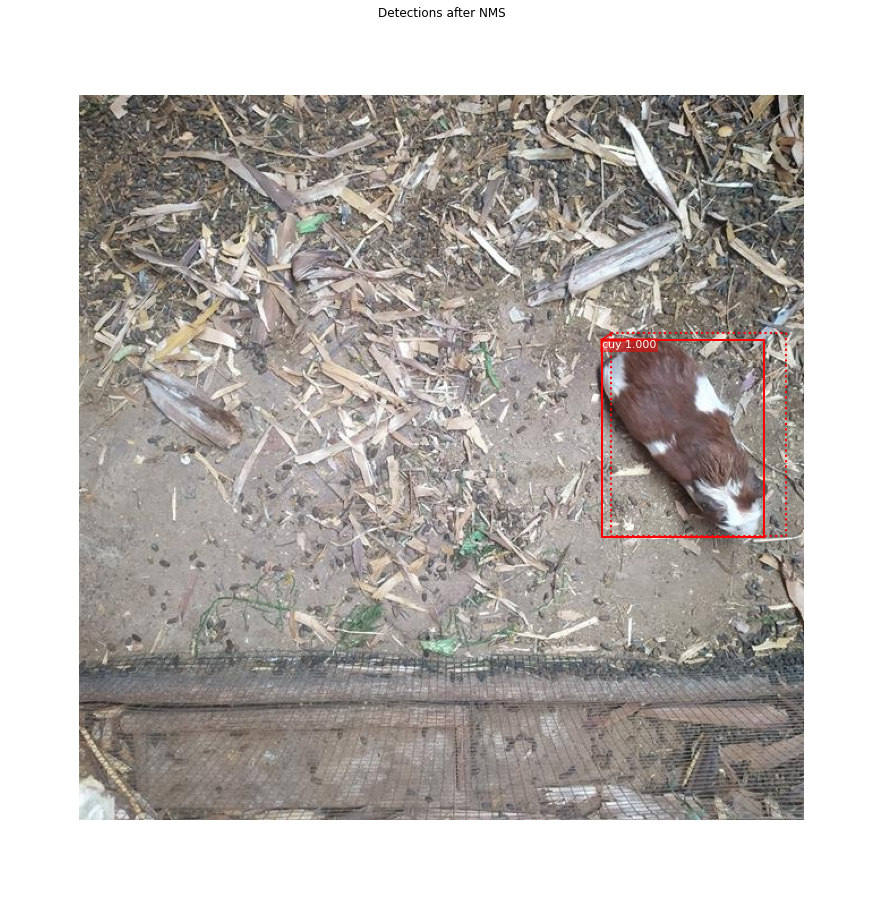

In [61]:
# Mostrar detecciones finales
ixs = np.arange(len(keep))  # Mostrar todo
# ixs = np.random.randint(0, len(keep), 10)  # Mostrar un ejemplo aleatorio
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[keep][ixs], roi_scores[keep][ixs])]
visualize.draw_boxes(
    image, boxes=proposals[keep][ixs],
    refined_boxes=refined_proposals[keep][ixs],
    visibilities=np.where(roi_class_ids[keep][ixs] > 0, 1, 0),
    captions=captions, title="Detections after NMS",
    ax=get_ax())

## Etapa 3: Generación de máscaras

Esta etapa toma las detecciones (cuadros delimitadores refinados y el ID de la clase) de la capa anterior y ejecuta la rama de la máscara para generar máscaras de segmentación para cada instancia.

### 3.a Máscara Targets

Estos son los targets de entrenamiento para la rama de la máscara.

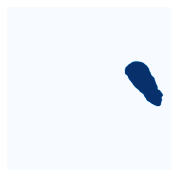

In [62]:
display_images(np.transpose(gt_mask, [2, 0, 1]), cmap="Blues")

### 3.b Máscaras predecidas

In [65]:
# Obtener la predicción de la rama de máscara
mrcnn = model.run_graph([[image],[image_meta]], [
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
])

# Obtener el ID de la clase de deteccion. Recortar zero padding
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

detections               shape: (1, 10, 6)            min:    0.00000  max:  605.00000
masks                    shape: (1, 10, 56, 56, 2)    min:    0.00016  max:    1.00000
1 detections: ['cuy']


In [75]:
# Máscaras
det_boxes = mrcnn["detections"][0, :, :4]
det_mask_specific = np.array([mrcnn["masks"][0, i, :, :, c] 
                              for i, c in enumerate(det_class_ids)])
det_masks = np.array([utils.unmold_mask(m, det_boxes[i].astype(int), image.shape)
                      for i, m in enumerate(det_mask_specific)])
log("det_mask_specific", det_mask_specific)
log("det_masks", det_masks)

det_mask_specific        shape: (1, 56, 56)           min:    0.00016  max:    1.00000
det_masks                shape: (1, 640, 640)         min:    0.00000  max:    1.00000


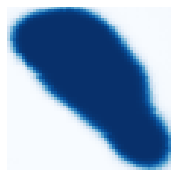

In [76]:
display_images(det_mask_specific[:4] * 255, cmap="Blues", interpolation="none")

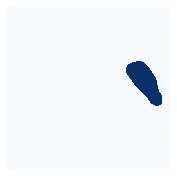

In [77]:
display_images(det_masks[:4] * 255, cmap="Blues", interpolation="none")

## Visualizar activaciones

En algunos casos, es útil observar la salida de diferentes capas y visualizarlas para detectar problemas y patrones extraños.

In [79]:
# Obtener las activaciones de algunas capas de muestra
activations = model.run_graph([[image], [image_meta]], [
    ("input_image",        tf.identity(model.keras_model.get_layer("input_image").output)),
    ("res4w_out",          model.keras_model.get_layer("res4w_out").output),  # for resnet100
    ("rpn_bbox",           model.keras_model.get_layer("rpn_bbox").output),
    ("roi",                model.keras_model.get_layer("ROI").output),
])

input_image              shape: (1, 640, 640, 3)      min:    0.00000  max:  255.00000
res4w_out                shape: (1, 40, 40, 1024)     min:    0.00000  max:   17.53414
rpn_bbox                 shape: (1, 102300, 4)        min:  -11.93558  max:   34.22849
roi                      shape: (1, 1000, 4)          min:    0.00000  max:    1.00000


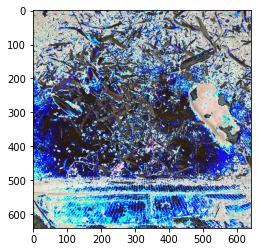

In [80]:
# Imagen de entrada (normalizada)
_ = plt.imshow(modellib.unmold_image(activations["input_image"][0],config))

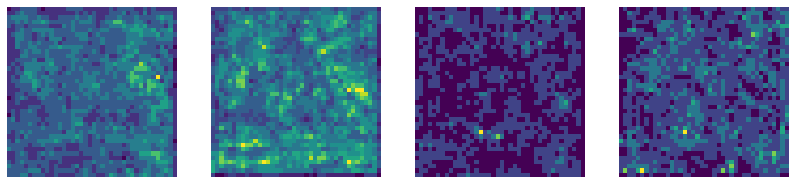

In [81]:
# Mapa de caracteristicas de la red troncal
display_images(np.transpose(activations["res4w_out"][0,:,:,:4], [2, 0, 1]))

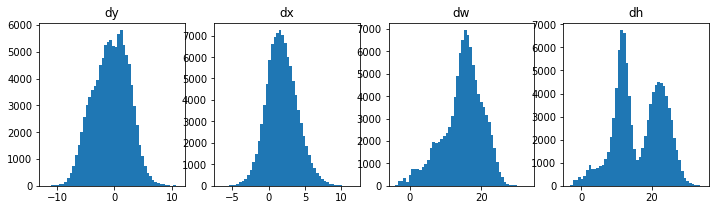

In [82]:
# Histogramas de deltas del cuadro delimitador de RPN
plt.figure(figsize=(12, 3))
plt.subplot(1, 4, 1)
plt.title("dy")
_ = plt.hist(activations["rpn_bbox"][0,:,0], 50)
plt.subplot(1, 4, 2)
plt.title("dx")
_ = plt.hist(activations["rpn_bbox"][0,:,1], 50)
plt.subplot(1, 4, 3)
plt.title("dw")
_ = plt.hist(activations["rpn_bbox"][0,:,2], 50)
plt.subplot(1, 4, 4)
plt.title("dh")
_ = plt.hist(activations["rpn_bbox"][0,:,3], 50)

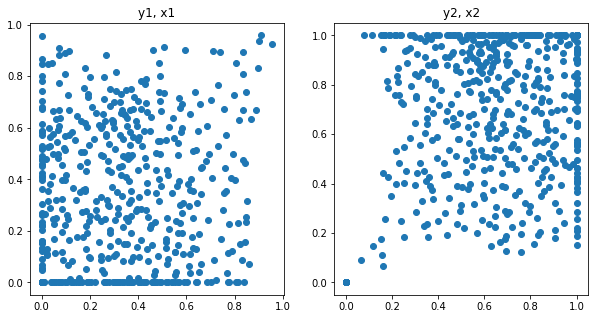

In [83]:
# Distribución de las coordenadas y,x de las propuestas generadas.
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("y1, x1")
plt.scatter(activations["roi"][0,:,0], activations["roi"][0,:,1])
plt.subplot(1, 2, 2)
plt.title("y2, x2")
plt.scatter(activations["roi"][0,:,2], activations["roi"][0,:,3])
plt.show()